# Harpy - Xenium - Downstream analysis.

## Read SpatialData
We will read in a fresh SpatialData object from the registry to pick up where we left off in the previous notebook.

In [ ]:
import tempfile
from pathlib import Path

import harpy as hp
from spatialdata import read_zarr

path = None  # change this on windows

tmp = tempfile.TemporaryDirectory(prefix="xenium_")
output_dir = Path(tmp.name)

sdata = hp.datasets.xenium_human_ovarian_cancer_course(
    checkpoint="checkpoint_2",
    path=path,
)

sdata.write(output_dir / "sdata.zarr", overwrite=True)

sdata = read_zarr(sdata.path)

no parent found for <ome_zarr.reader.Label object at 0x0000018F41B899A0>: None
no parent found for <ome_zarr.reader.Label object at 0x0000018F41C6FC20>: None
no parent found for <ome_zarr.reader.Label object at 0x0000018F41C86E40>: None
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning:

## 10. Cell type annotation
Cell type annotation is fairly complex and requires a lot of biological insights to do correctly. We will show some approaches here, but others exist as well.

10X Genomics has a good [analysis guide](https://www.10xgenomics.com/analysis-guides/xenium-cell-type-annotation) on how they annotated the cell types in this dataset using label transfer from an accompanying scRNAseq reference dataset.

#### 10.1 Annotating clusters

In [2]:
# First, we specify a dictionary with marker genes for the different cell types of interest.
marker_genes_dict = {
    "Urothelial-like Cells": [
        "SLC40A1",
        "TRIM29",
        "DSC3",
        "TNS4",
        "PLAT",
        "ANXA8",
        "AVPI1",
        "FGFR3",
    ],
    "Proliferative Tumor Cells": [
        "SMC4",
        "UCHL1",
        "TPX2",
        "BIRC5",
        "TOP2A",
        "STMN1",
        "MYBL2",
        "CENPF",
        "CDK1",
        "TYMS",
    ],
    "Tumor Cells": ["PLXNB1", "CP", "NORAD", "PRKCI", "MUC16", "RGL3"],
    "Tumor Associated Fibroblasts": [
        "LUM",
        "BGN",
        "COL5A1",
        "MMP14",
        "CTHRC1",
        "COL5A2",
        "CCN2",
        "COL11A1",
        "THBS2",
        "LOXL1",
        "CDH11",
        "PLAU",
        "INHBA",
        "SERPINE1",
        "ADAMTS14",
        "LOX",
    ],
    "Smooth Muscle Cells": ["MYH11", "C11orf96", "CNN1"],
    "Macrophages": ["C1QC", "MS4A6A", "AIF1", "FCGR2A", "ITGB2", "CD14", "MSR1"],
    "SOX2-OTpos Tumor Cells": ["NAMPT", "SOST", "SOX2-OT"],
    "Stromal Associated Fibroblasts": ["C7", "ABCA10"],
    "Stromal Associated Endothelial Cells": ["AQP1", "EPAS1"],
    "T and NK Cells": ["TRAC", "CD52", "CD8A", "TRBC1"],
    "Pericytes": ["COL4A1", "HEYL", "PDGFRB", "ENPEP", "AVPR1A", "RGS5", "PDGFA"],
    "Tumor Associated Endothelial Cells": [
        "FLT1",
        "PLVAP",
        "PTPRB",
        "ESM1",
        "CD93",
        "PECAM1",
        "NOTCH4",
        "EGFL7",
        "CLEC14A",
    ],
    "VEGFApos Tumor Cells": [
        "TFPI2",
        "NDRG1",
        "SLC2A1",
        "VEGFA",
        "AMOTL2",
        "P4HA1",
        "ALDOA",
        "ANKRD33B",
    ],
    "Fallopian Tube Epithelium": ["AC007906.2", "KCNC3", "PFKFB3"],
    "Malignant Cells Lining Cyst": [
        "CLDN1",
        "C4B",
        "PROCR",
        "C4A",
        "DSC3",
        "PRG4",
        "RGS4",
        "CALB2",
        "BNC1",
        "CPA4",
    ],
    "Inflammatory Tumor Cells": [
        "MX1",
        "STAT1",
        "IFI44L",
        "SAMD9",
        "IFIT1",
        "PLSCR1",
        "IFIT3",
        "GBP1",
        "DDX58",
        "OAS3",
        "RSAD2",
        "CXCL10",
        "IFIT2",
        "IFI35",
        "PNPT1",
        "IFIH1",
        "OAS1",
        "TNFSF10",
    ],
    "Ciliated Epithelial Cells": [
        "C20orf85",
        "CFAP100",
        "FAM183A",
        "TEKT1",
        "TPPP3",
        "ERICH3",
        "CDHR4",
        "FAM216B",
        "IL5RA",
        "CFAP47",
        "LDLRAD1",
    ],
}

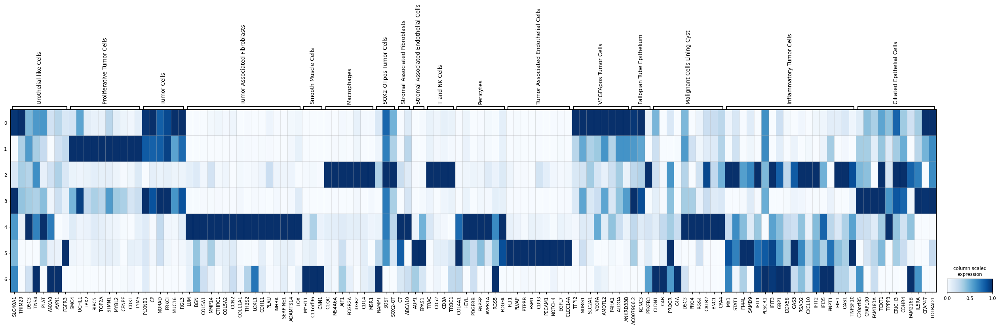

In [3]:
# We can visualize the expression of these marker genes in the Leiden clusters using a scanpy's matrix plot.
import scanpy as sc

sc.pl.matrixplot(
    sdata.tables["table_transcriptomics_preprocessed"],
    var_names=marker_genes_dict,
    groupby="leiden",
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
    figsize=(32, 6),
)

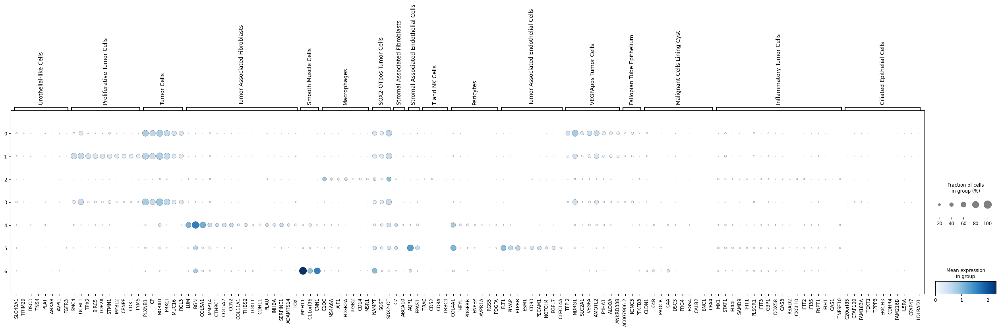

In [4]:
# We can also use a dot plot
sc.pl.dotplot(
    sdata.tables["table_transcriptomics_preprocessed"],
    var_names=marker_genes_dict,
    groupby="leiden",
    cmap="Blues",
    figsize=(32, 6),
)

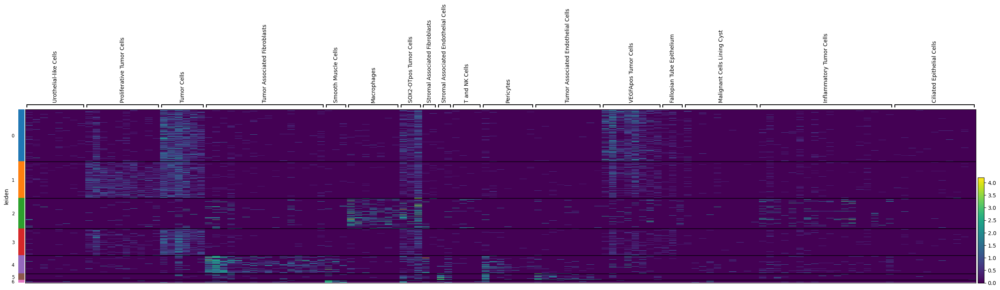

In [5]:
# The heatmap plot does not collapse the cells into a single average value per cluster
sc.pl.heatmap(
    sdata.tables["table_transcriptomics_preprocessed"],
    var_names=marker_genes_dict,
    groupby="leiden",
    cmap="viridis",
    figsize=(32, 6),
)

# For more visualization options, see the scanpy documentation: https://scanpy.readthedocs.io/en/stable/tutorials/plotting/core.html

#### 10.2 Annotating cells using sc.tl.score_genes

We can also use a marker gene list and score cells for each cell type using those markers via scanpy's `sc.tl.score_genes` function.

In [6]:
import pandas as pd

all_genes = sorted(set(gene for genes in marker_genes_dict.values() for gene in genes))

# Create one-hot matrix
df = pd.DataFrame(0, index=all_genes, columns=marker_genes_dict.keys())

for cell_type, genes in marker_genes_dict.items():
    df.loc[genes, cell_type] = 1

df.columns = df.columns.str.replace(" ", "_", regex=False)  # whitespaces no longer allowed since spatialdata>=0.3.0
df

,Urothelial-like_Cells,Proliferative_Tumor_Cells,Tumor_Cells,Tumor_Associated_Fibroblasts,Smooth_Muscle_Cells,Macrophages,SOX2-OTpos_Tumor_Cells,Stromal_Associated_Fibroblasts,Stromal_Associated_Endothelial_Cells,T_and_NK_Cells,Pericytes,Tumor_Associated_Endothelial_Cells,VEGFApos_Tumor_Cells,Fallopian_Tube_Epithelium,Malignant_Cells_Lining_Cyst,Inflammatory_Tumor_Cells,Ciliated_Epithelial_Cells
ABCA10,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
AC007906.2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
ADAMTS14,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
AIF1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
ALDOA,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TRBC1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
TRIM29,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
TYMS,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
UCHL1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [7]:
# Annotate cells
import harpy as hp

sdata, celltypes_scored, celltypes_all = hp.tb.score_genes(
    sdata,
    labels_name="nucleus_segmentation_mask",
    table_name="table_transcriptomics_preprocessed",
    output_table_name="table_transcriptomics_annotated",
    marker_genes=df,  # marker_genes can also be a path to a CSV-file
    overwrite=True,
)

C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding w

In [8]:
# Inspect new table layer
sdata["table_transcriptomics_annotated"]

AnnData object with n_obs × n_vars = 5299 × 5067
    obs: 'cell_ID', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize', 'shapeSize_microns', 'leiden', 'Urothelial-like_Cells', 'Proliferative_Tumor_Cells', 'Tumor_Cells', 'Tumor_Associated_Fibroblasts', 'Smooth_Muscle_Cells', 'Macrophages', 'SOX2-OTpos_Tumor_Cells', 'Stromal_Associated_Fibroblasts', 'Stromal_Associated_Endothelial_Cells', 'T_and_NK_Cells', 'Pericytes', 'Tumor_Associated_Endothelial_Cells', 'VEGFApos_Tumor_Cells', 'Fallopian_Tube_Epithelium', 'Malignant_Cells_Lining_Cyst', 'Inflammatory_Tumor_Cells', 'Ciliated_Epithelial_Cells', 'Cleanliness', 'annotation'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'leiden', 'log1p', 'leiden_colors', 'spatialdata_attrs', 'umap', 'neighbors',

In [9]:
# Inspect new table layer obs
sdata.tables["table_transcriptomics_annotated"].obs.head()

,cell_ID,fov_labels,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_2_genes,pct_counts_in_top_5_genes,n_counts,shapeSize,...,T_and_NK_Cells,Pericytes,Tumor_Associated_Endothelial_Cells,VEGFApos_Tumor_Cells,Fallopian_Tube_Epithelium,Malignant_Cells_Lining_Cyst,Inflammatory_Tumor_Cells,Ciliated_Epithelial_Cells,Cleanliness,annotation
cells,,,,,,,,,,,,,,,,,,,,,
1039_nucleus_segmentation_mask_efa3e768,1039,nucleus_segmentation_mask,168,5.129899,218,5.389072,7.339450,12.844037,218,2289.0,...,-0.052961,-0.048470,-0.035546,-0.161140,-0.054146,-0.025096,-0.039023,-0.025915,0.009918,SOX2-OTpos_Tumor_Cells
1071_nucleus_segmentation_mask_efa3e768,1071,nucleus_segmentation_mask,312,5.746203,414,6.028279,3.864734,7.487923,414,1884.0,...,-0.038960,0.215643,0.813045,0.166201,-0.062571,-0.022849,-0.065246,-0.030586,0.478158,Stromal_Associated_Endothelial_Cells
1135_nucleus_segmentation_mask_efa3e768,1135,nucleus_segmentation_mask,220,5.398163,305,5.723585,5.245902,10.819672,305,2185.0,...,-0.024668,0.245836,-0.030803,-0.126126,-0.091473,-0.024581,0.016745,-0.039958,0.523699,Tumor_Associated_Fibroblasts
1167_nucleus_segmentation_mask_efa3e768,1167,nucleus_segmentation_mask,190,5.252273,239,5.480639,9.623431,14.644351,239,2062.0,...,-0.040860,0.087868,-0.035712,-0.115099,-0.070388,0.162849,-0.038506,-0.013934,1.028698,Smooth_Muscle_Cells
1199_nucleus_segmentation_mask_efa3e768,1199,nucleus_segmentation_mask,106,4.672829,118,4.779123,5.932203,11.864407,118,1027.0,...,-0.044920,-0.032150,-0.022309,-0.112488,-0.053185,-0.022925,-0.047915,0.099430,1.722750,Macrophages


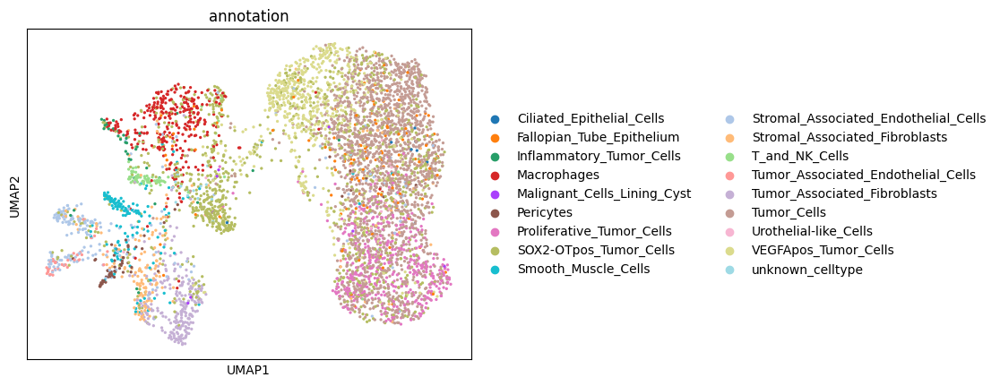

In [10]:
# Plot cell type annotations on UMAP
import scanpy as sc

sc.pl.umap(sdata.tables["table_transcriptomics_annotated"], color="annotation")

<Axes: title={'center': 'Annotation'}>

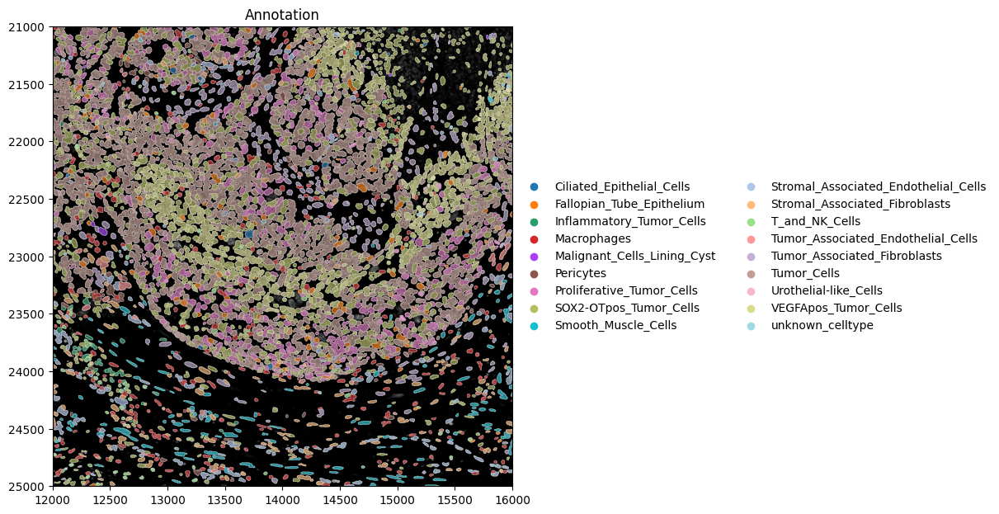

In [11]:
# Plot cell type annotations spatially
import harpy as hp

xmin = 12000
xmax = 16000
ymin = 21000
ymax = 25000

hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_annotated",
    labels_name="nucleus_segmentation_mask",
    color="annotation",
    crd=(xmin, xmax, ymin, ymax),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey"},
    render_labels_kwargs={"fill_alpha": 0.6, "outline_alpha": 1.0},
    show_kwargs={"title": "Annotation", "colorbar": False, "figsize": (12, 12)},
)

In [12]:
# Let's inspect the cell type counts and percentages
counts = sdata.tables["table_transcriptomics_annotated"].obs["annotation"].value_counts()
percentages = sdata.tables["table_transcriptomics_annotated"].obs["annotation"].value_counts(normalize=True) * 100

cluster_summary = pd.DataFrame({"count": counts, "percentage": percentages.round(2)})

print(cluster_summary)

                                      count  percentage
annotation                                             
Tumor_Cells                            1827       34.48
SOX2-OTpos_Tumor_Cells                 1007       19.00
VEGFApos_Tumor_Cells                    587       11.08
Proliferative_Tumor_Cells               426        8.04
Macrophages                             297        5.60
Tumor_Associated_Fibroblasts            242        4.57
Stromal_Associated_Endothelial_Cells    206        3.89
Stromal_Associated_Fibroblasts          166        3.13
Smooth_Muscle_Cells                     148        2.79
Fallopian_Tube_Epithelium               125        2.36
T_and_NK_Cells                           67        1.26
Pericytes                                66        1.25
Tumor_Associated_Endothelial_Cells       41        0.77
Inflammatory_Tumor_Cells                 37        0.70
unknown_celltype                         21        0.40
Urothelial-like_Cells                    18     

## 11. Using region annotations
We can use region annotations to assign which cells occurs within or outside those regions, calculate distances to the edge of the annotation, filter cells based on their relation the region annotation, etc.

Note that one should be very careful here to consider all coordinate spaces and transformations involved to make sure the results are correct.

In [13]:
import geopandas as gpd
from spatialdata.models import TableModel

# Get spatial coordinates
spatial_coords = sdata.tables["table_transcriptomics_annotated"].obsm["spatial"]
spatial_coords_df = pd.DataFrame(
    spatial_coords,
    columns=["x", "y"],
    index=sdata.tables["table_transcriptomics_annotated"].obs.index,
)

# Build points GeoDataFrame from centroids
points = gpd.GeoDataFrame(
    spatial_coords_df.copy(),
    geometry=gpd.points_from_xy(spatial_coords_df["x"], spatial_coords_df["y"]),
)

# If tumor has multiple polygons, combine once
tumor_union = sdata.shapes["tumor"].geometry.union_all()

# Vectorized test
in_tumor_mask = points.geometry.within(tumor_union)

yes_no = pd.Series(in_tumor_mask).map({True: "In tumor", False: "Not in tumor"})
cat_type = pd.CategoricalDtype(categories=["In tumor", "Not in tumor"], ordered=True)

sdata.tables["table_transcriptomics_annotated"].obs["in_tumor"] = yes_no.astype(cat_type).values

region = sdata.tables["table_transcriptomics_annotated"].uns[TableModel.ATTRS_KEY][TableModel.REGION_KEY]

sdata = hp.tb.add_table(
    sdata,
    adata=sdata.tables["table_transcriptomics_annotated"],
    output_table_name="table_transcriptomics_annotated",
    region=region,
    overwrite=True,
)

C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding w

In [14]:
sdata["table_transcriptomics_annotated"].obs.head()

,cell_ID,fov_labels,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_2_genes,pct_counts_in_top_5_genes,n_counts,shapeSize,...,Pericytes,Tumor_Associated_Endothelial_Cells,VEGFApos_Tumor_Cells,Fallopian_Tube_Epithelium,Malignant_Cells_Lining_Cyst,Inflammatory_Tumor_Cells,Ciliated_Epithelial_Cells,Cleanliness,annotation,in_tumor
cells,,,,,,,,,,,,,,,,,,,,,
1039_nucleus_segmentation_mask_efa3e768,1039,nucleus_segmentation_mask,168,5.129899,218,5.389072,7.339450,12.844037,218,2289.0,...,-0.048470,-0.035546,-0.161140,-0.054146,-0.025096,-0.039023,-0.025915,0.009918,SOX2-OTpos_Tumor_Cells,Not in tumor
1071_nucleus_segmentation_mask_efa3e768,1071,nucleus_segmentation_mask,312,5.746203,414,6.028279,3.864734,7.487923,414,1884.0,...,0.215643,0.813045,0.166201,-0.062571,-0.022849,-0.065246,-0.030586,0.478158,Stromal_Associated_Endothelial_Cells,Not in tumor
1135_nucleus_segmentation_mask_efa3e768,1135,nucleus_segmentation_mask,220,5.398163,305,5.723585,5.245902,10.819672,305,2185.0,...,0.245836,-0.030803,-0.126126,-0.091473,-0.024581,0.016745,-0.039958,0.523699,Tumor_Associated_Fibroblasts,Not in tumor
1167_nucleus_segmentation_mask_efa3e768,1167,nucleus_segmentation_mask,190,5.252273,239,5.480639,9.623431,14.644351,239,2062.0,...,0.087868,-0.035712,-0.115099,-0.070388,0.162849,-0.038506,-0.013934,1.028698,Smooth_Muscle_Cells,Not in tumor
1199_nucleus_segmentation_mask_efa3e768,1199,nucleus_segmentation_mask,106,4.672829,118,4.779123,5.932203,11.864407,118,1027.0,...,-0.032150,-0.022309,-0.112488,-0.053185,-0.022925,-0.047915,0.099430,1.722750,Macrophages,Not in tumor


<Axes: title={'center': 'Tumor'}>

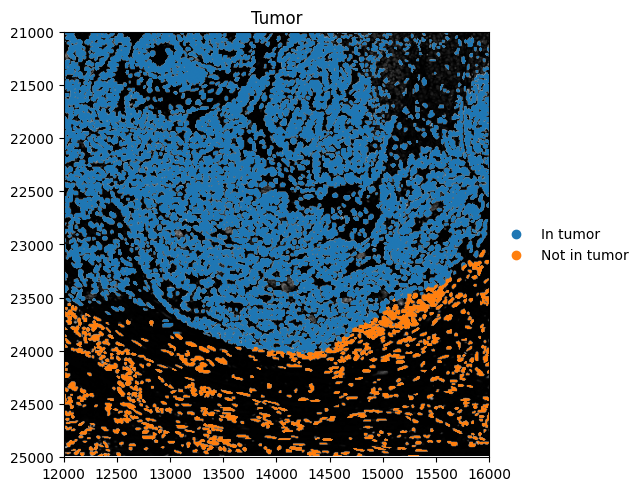

In [15]:
hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_annotated",
    labels_name="nucleus_segmentation_mask",
    color="in_tumor",
    # crd=(min_x, max_x, min_y, max_y),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey", "colorbar": False},
    render_labels_kwargs={"fill_alpha": 1},
    show_kwargs={"title": "Tumor", "colorbar": True},
)

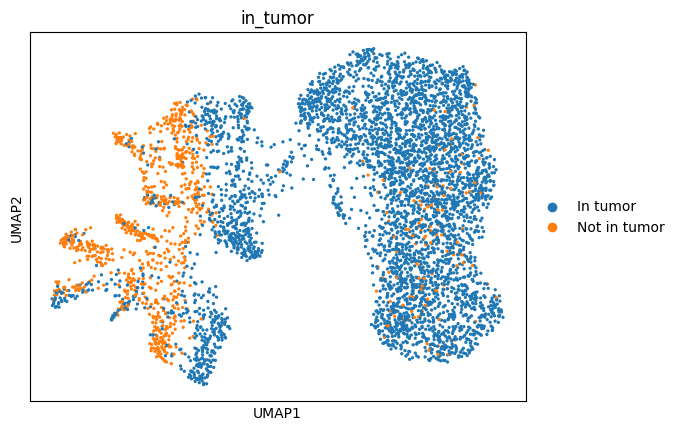

In [16]:
# We can now check where the annotated cells are located in the UMAP
sc.pl.umap(sdata.tables["table_transcriptomics_annotated"], color=["in_tumor"], show=True)

## 12 Squidpy

#### 12.1 Constructing spatial graphs
The spatial graph is a network where each node represents an observation (spot/cell) and edges signify neighborhood relationships (calculated based on the spatial coordiantes of the observations). This graph is useful for various analyses, such as neighborhood enrichment and calcualting spatial statistics such as spatial autocorrelation.

We use squidpy.gr.spatial_neighbors to compute the spatial neighbors graph in this non-grid dataset, setting coord_type="generic", and n_neighs=6 to specify that each observation should have 6 neighbors (this is called K-nearest neighbors(KNN)). We could also calculate neighbor relationships based on a radius around each cell or we could set delaunay=True to apply Delaunay triangulation.

In [17]:
# Try calculating spatial neighbors using Squidpy

import squidpy as sq

sq.gr.spatial_neighbors(
    adata=sdata["table_transcriptomics_annotated"],
    coord_type="generic",  # Set to 'generic' for targeted spatial transcriptomics
    n_neighs=6,  # Only used when delaunay = False
    radius=None,  # To compute the neighbors based on the radius
    delaunay=False,  # Whether to compute the graph from Delaunay triangulation
    set_diag=False,  # Whether to set the diagonal of the connectivity matrix to 1 (i.e. whether cells should be considered neighbors of themselves).
    key_added="KNN",
)

sdata.tables["table_transcriptomics_annotated"]

INFO     Creating graph using `generic` coordinates and `None` transform and `1` libraries.                        


AnnData object with n_obs × n_vars = 5299 × 5067
    obs: 'cell_ID', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize', 'shapeSize_microns', 'leiden', 'Urothelial-like_Cells', 'Proliferative_Tumor_Cells', 'Tumor_Cells', 'Tumor_Associated_Fibroblasts', 'Smooth_Muscle_Cells', 'Macrophages', 'SOX2-OTpos_Tumor_Cells', 'Stromal_Associated_Fibroblasts', 'Stromal_Associated_Endothelial_Cells', 'T_and_NK_Cells', 'Pericytes', 'Tumor_Associated_Endothelial_Cells', 'VEGFApos_Tumor_Cells', 'Fallopian_Tube_Epithelium', 'Malignant_Cells_Lining_Cyst', 'Inflammatory_Tumor_Cells', 'Ciliated_Epithelial_Cells', 'Cleanliness', 'annotation', 'in_tumor'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'annotation_colors', 'log1p', 'neighbors', 'pca', 'leiden', 'leid

In [18]:
# BUT, this is not yet backed to the zarr store!
from spatialdata import read_zarr

sdata = read_zarr(sdata.path)

sdata.tables["table_transcriptomics_annotated"]

# NOTE: .uns["spatial_neighbors"], .obsp["spatial_connectivities"] and .obsp["spatial_distances"] are no longer in table!

no parent found for <ome_zarr.reader.Label object at 0x0000018F4B42BE00>: None
no parent found for <ome_zarr.reader.Label object at 0x0000018F4B4236E0>: None
no parent found for <ome_zarr.reader.Label object at 0x0000018F4B4483B0>: None
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


AnnData object with n_obs × n_vars = 5299 × 5067
    obs: 'cell_ID', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize', 'shapeSize_microns', 'leiden', 'Urothelial-like_Cells', 'Proliferative_Tumor_Cells', 'Tumor_Cells', 'Tumor_Associated_Fibroblasts', 'Smooth_Muscle_Cells', 'Macrophages', 'SOX2-OTpos_Tumor_Cells', 'Stromal_Associated_Fibroblasts', 'Stromal_Associated_Endothelial_Cells', 'T_and_NK_Cells', 'Pericytes', 'Tumor_Associated_Endothelial_Cells', 'VEGFApos_Tumor_Cells', 'Fallopian_Tube_Epithelium', 'Malignant_Cells_Lining_Cyst', 'Inflammatory_Tumor_Cells', 'Ciliated_Epithelial_Cells', 'Cleanliness', 'annotation', 'in_tumor'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'leiden', 'leiden_colors', 'pca', 'log1p', 'annotation_colors', '

In [19]:
# Let's try calculating the spatial neighbors again, but we'll make sure the new table is backed to the zarr store by using hp.tb.add_table_layer().
sq.gr.spatial_neighbors(
    adata=sdata["table_transcriptomics_annotated"],
    coord_type="generic",  # Set to 'generic' for targeted spatial transcriptomics
    n_neighs=6,  # Only used when delaunay = False
    radius=None,  # To compute the neighbors based on the radius
    delaunay=False,  # Whether to compute the graph from Delaunay triangulation
    set_diag=False,  # Whether to set the diagonal of the connectivity matrix to 1 (i.e. whether cells should be considered neighbors of themselves).
    key_added="KNN",
)

region = sdata.tables["table_transcriptomics_annotated"].uns[TableModel.ATTRS_KEY][TableModel.REGION_KEY]

sdata = hp.tb.add_table(
    sdata,
    adata=sdata.tables["table_transcriptomics_annotated"],
    output_table_name="table_transcriptomics_squidpy",
    region=region,  # A list of regions to associate with the table data. Typically this is all unique elements in adata.obs[_REGION_KEY].
    overwrite=True,
)

INFO     Creating graph using `generic` coordinates and `None` transform and `1` libraries.                        


C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding w

In [20]:
# Inspect spatial connectivities of first 5 rows and colomns
sdata.tables["table_transcriptomics_squidpy"].obsp["KNN_connectivities"].toarray()[0:5, 0:5]

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0.]], dtype=float32)

In [21]:
# Inspect spatial distances
sdata.tables["table_transcriptomics_squidpy"].obsp["KNN_distances"].toarray()[0:5, 0:5]

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , 97.58204092,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        , 97.58204092,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ]])

In [22]:
# Inspect number of neighbors (for first 5cells)
sdata.tables["table_transcriptomics_squidpy"].obsp["KNN_connectivities"].toarray().sum(axis=1)[
    0:5
]  # sums across the columns for each row

# NOTE: Every cell has exactly 6 neighbors when using n_neigh=6

array([6., 6., 6., 6., 6.], dtype=float32)

In [23]:
# Inspect for every cell how many cells have it as a neighbor (for first 5 cells)
sdata.tables["table_transcriptomics_squidpy"].obsp["KNN_connectivities"].toarray().sum(axis=0)[
    0:5
]  # sums across the rows for each column

# NOTE: Not every cell is a neighbor of exactly 6 cells when using n_neigh=6

array([4., 7., 7., 5., 5.], dtype=float32)

c:\Users\julien.mortier\code\targeted_transcriptomics_training\.venv\Lib\site-packages\squidpy\pl\_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


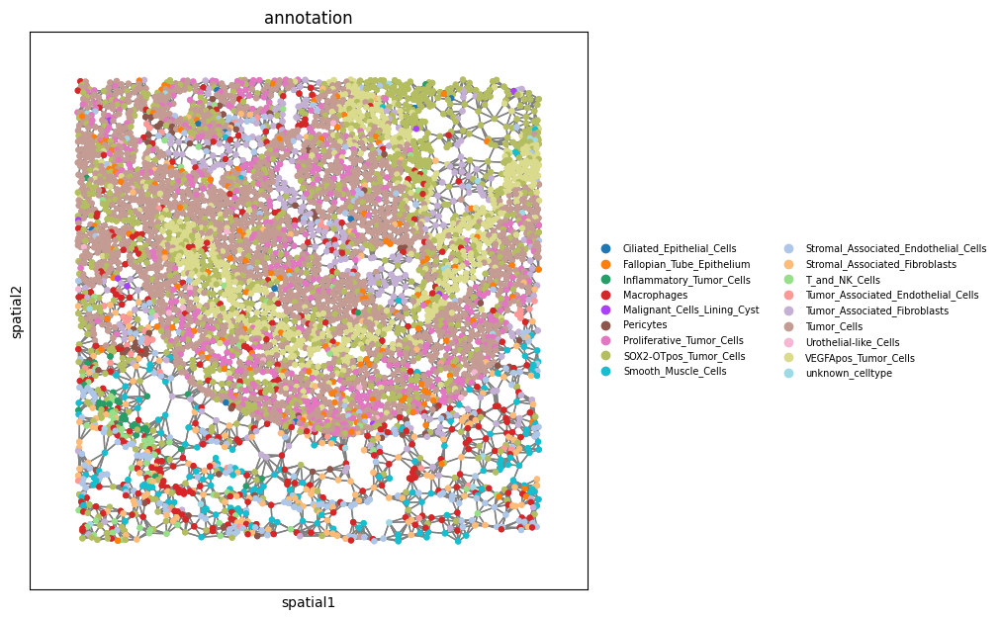

In [24]:
sq.pl.spatial_scatter(
    sdata.tables["table_transcriptomics_squidpy"],
    shape=None,
    color="annotation",
    connectivity_key="KNN_connectivities",
    size=50,
    figsize=(10, 10),
    # legend_loc="best",
    legend_fontsize=7,
    # dpi=300,
)

<b>Excercise</b>:

- Build a graph of spatial neighbors using a radius (e.g. 150 pixels) and plot the results using 'sq.pl.spatial_scatter'. Inspect the neighbor relationships in both directions for the first 5 cells. How does this compare to the results for 6-nearest neighbors spatial graph? Do the same for Delaunay triangulation.

<details>
<summary>Click to reveal the solution</summary>

```python
# radius-based spatial graphs
from harpy.utils._keys import _REGION_KEY

sq.gr.spatial_neighbors(
    adata=sdata["table_transcriptomics_preprocessed"], 
    coord_type="generic", # Set to 'generic' for targeted spatial transcriptomics
    n_neighs=6, # Only used when delaunay = False
    radius=150, # To compute the neighbors based on the radius
    delaunay=False, # Whether to compute the graph from Delaunay triangulation
    set_diag=False, # Whether to set the diagonal of the connectivity matrix to 1 (i.e. whether cells should be considered neighbors of themselves).
    key_added="radius"
)

region = sdata["table_transcriptomics_preprocessed"].obs[_REGION_KEY].cat.categories.to_list()

sdata = hp.tb.add_table_layer(
    sdata,
    adata=sdata.tables["table_transcriptomics_preprocessed"],
    output_layer="table_transcriptomics_squidpy",
    region=region, # A list of regions to associate with the table data. Typically this is all unique elements in adata.obs[_REGION_KEY].
    overwrite=True,
)

print('Inspect number of neighbors (for first 5 cells):')
display(sdata.tables['table_transcriptomics_squidpy'].obsp['radius_connectivities'].toarray().sum(axis=1)[0:5])

print('Inspect for every cell how many cells have it as a neighbor (for first 5 cells):')
display(sdata.tables['table_transcriptomics_squidpy'].obsp['radius_connectivities'].toarray().sum(axis=0)[0:5])

sq.pl.spatial_scatter(
    sdata.tables["table_transcriptomics_squidpy"],
    shape=None,
    color="annotation",
    connectivity_key="radius_connectivities",
    size=10,
    figsize=(10,10),
    legend_loc='best',
    legend_fontsize=7,
    dpi=300
)

# Delaunay triangulation
from harpy.utils._keys import _REGION_KEY

sq.gr.spatial_neighbors(
    adata=sdata["table_transcriptomics_preprocessed"], 
    coord_type="generic", # Set to 'generic' for targeted spatial transcriptomics
    n_neighs=6, # Only used when delaunay = False
    radius=None, # To compute the neighbors based on the radius
    delaunay=True, # Whether to compute the graph from Delaunay triangulation
    set_diag=False, # Whether to set the diagonal of the connectivity matrix to 1 (i.e. whether cells should be considered neighbors of themselves).
    key_added="delaunay"
)

region = sdata["table_transcriptomics_preprocessed"].obs[_REGION_KEY].cat.categories.to_list()

sdata = hp.tb.add_table_layer(
    sdata,
    adata=sdata.tables["table_transcriptomics_preprocessed"],
    output_layer="table_transcriptomics_squidpy",
    region=region, # A list of regions to associate with the table data. Typically this is all unique elements in adata.obs[_REGION_KEY].
    overwrite=True,
)

print('Inspect number of neighbors (for first 5 cells):')
display(sdata.tables['table_transcriptomics_squidpy'].obsp['delaunay_connectivities'].toarray().sum(axis=1)[0:5])

print('Inspect for every cell how many cells have it as a neighbor (for first 5 cells):')
display(sdata.tables['table_transcriptomics_squidpy'].obsp['delaunay_connectivities'].toarray().sum(axis=0)[0:5])

sq.pl.spatial_scatter(
    sdata.tables["table_transcriptomics_squidpy"],
    shape=None,
    color="annotation",
    connectivity_key="delaunay_connectivities",
    size=10,
    figsize=(10,10),
    legend_loc='best',
    legend_fontsize=7,
    dpi=300
)

#### 12.2 Neighborhood enrichment analysis
Then we can calculate the neighborhood enrichment score with squidpy.gr.nhood_enrichment. This function will generate a dictionary stored in adata.uns['annotated_nhood_enrichment'] that will contain a z scores matrix and and a count matrix.

The count matrix represents how often each pair of cell types are neighbors in the dataset. Each row in this count matrix represents a cell type, and each column shows how many times it’s connected to other cell types.

For each pair of cell types, the observed counts from the original data are compared to, for example, 1000 permutations (depending on the n_perms argument) and a z-score is calculated. The z-score is a measure of how many standard deviations the observed count deviates from the distribution generated by random permutations.

In [25]:
# Calculate neighborhood enrichment
sq.gr.nhood_enrichment(
    sdata.tables["table_transcriptomics_squidpy"],
    cluster_key="annotation",
    connectivity_key="KNN",
)

# Add table layer to back to zarr
sdata = hp.tb.add_table(
    sdata,
    adata=sdata.tables["table_transcriptomics_squidpy"],
    output_table_name="table_transcriptomics_squidpy",
    region=region,
    overwrite=True,
)

# NOTE: Also see harpy.tb.nhood_enrichment and harpy.pl.nhood_enrichment

  0%|          | 0/1000 [00:00<?, ?/s]

C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding w

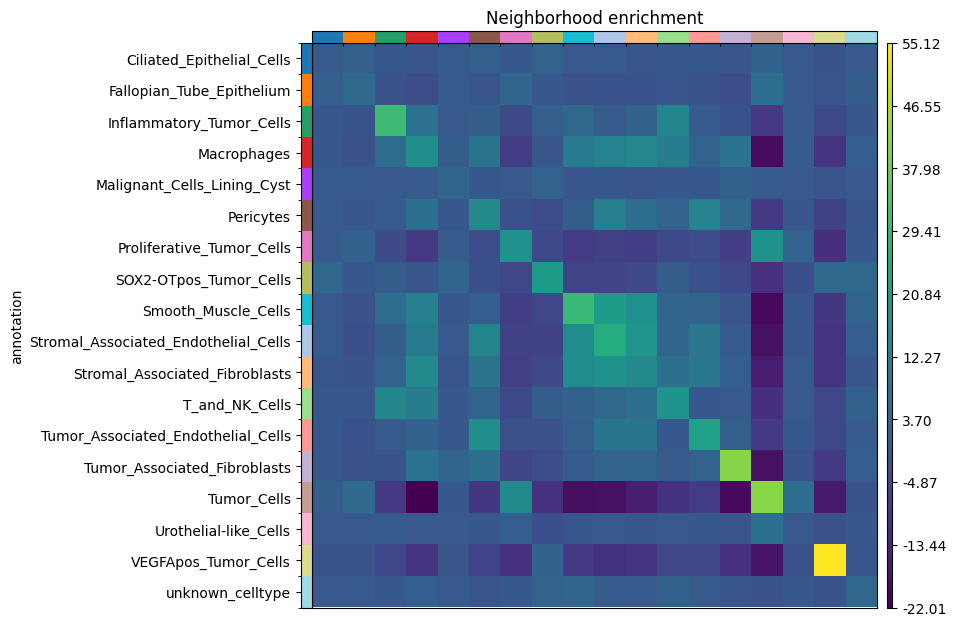

In [26]:
# Plot neighborhood enrichment
sq.pl.nhood_enrichment(
    sdata.tables["table_transcriptomics_squidpy"],
    cluster_key="annotation",
    figsize=(6, 6),
    mode="zscore",
)

#### 12.3 Spatial autocorrelation
Moran’s I can be understood as the Pearson correlation between the value at each location and the average value at its neighbors. Just like Pearson correlation, Moran’s I is bound between -1 and 1, where positive value indicates positive spatial autocorrelation and negative value indicates negative spatial autocorrelation.

In [27]:
# Calculate Moran’s I global spatial auto-correlation statistics
sq.gr.spatial_autocorr(
    adata=sdata.tables["table_transcriptomics_squidpy"],
    mode="moran",
    n_perms=10,  # We set this to 10 to speed up the calculations for the training. When working with actual data, n_perms=100 is probably more appropriate.
    n_jobs=1,
    connectivity_key="KNN_connectivities",
)

# Add table layer to back to zarr
sdata = hp.tb.add_table(
    sdata,
    adata=sdata.tables["table_transcriptomics_squidpy"],
    output_table_name="table_transcriptomics_squidpy",
    region=region,
    overwrite=True,
)

  0%|          | 0/10 [00:00<?, ?/s]

C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding w

In [28]:
# Inspect highest Moran's I scores
sdata.tables["table_transcriptomics_squidpy"].uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
H19,0.693467,0.0,0.000058,0.0,0.090909,0.000063,0.0,0.0,0.167382
CXCL10,0.503239,0.0,0.000058,0.0,0.090909,0.000040,0.0,0.0,0.167382
EEF1G,0.476516,0.0,0.000058,0.0,0.090909,0.000154,0.0,0.0,0.167382
MX1,0.450297,0.0,0.000058,0.0,0.090909,0.000044,0.0,0.0,0.167382
IFIT2,0.424502,0.0,0.000058,0.0,0.090909,0.000063,0.0,0.0,0.167382
TFPI2,0.423472,0.0,0.000058,0.0,0.090909,0.000097,0.0,0.0,0.167382
BGN,0.408520,0.0,0.000058,0.0,0.090909,0.000080,0.0,0.0,0.167382
CD47,0.403728,0.0,0.000058,0.0,0.090909,0.000081,0.0,0.0,0.167382
NDRG1,0.400238,0.0,0.000058,0.0,0.090909,0.000119,0.0,0.0,0.167382
LCN2,0.381686,0.0,0.000058,0.0,0.090909,0.000053,0.0,0.0,0.167382


In [29]:
# Inspect lowest Moran's I scores
sdata.tables["table_transcriptomics_squidpy"].uns["moranI"].tail(10)

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
NT5C2,-0.013203,0.044161,0.000058,1.982525e-03,0.090909,0.000027,0.117770,5.630859e-03,0.167382
HK1,-0.013780,0.037550,0.000058,9.727092e-03,0.090909,0.000031,0.103574,2.355984e-02,0.167382
PIGF,-0.013785,0.037500,0.000058,1.128844e-07,0.090909,0.000007,0.103494,5.457875e-07,0.167382
ATG10,-0.013895,0.036337,0.000058,1.469407e-03,0.090909,0.000019,0.100952,4.281475e-03,0.167382
LARP4B,-0.014398,0.031388,0.000058,4.862862e-05,0.090909,0.000019,0.089383,1.779070e-04,0.167382
PHETA1,-0.014740,0.028353,0.000058,1.497299e-02,0.090909,0.000036,0.081860,3.443855e-02,0.167382
EPG5,-0.014825,0.027638,0.000058,1.496073e-03,0.090909,0.000031,0.080116,4.354166e-03,0.167382
SLC17A5,-0.015063,0.025716,0.000058,4.352908e-04,0.090909,0.000024,0.075320,1.390680e-03,0.167382
SLC4A1AP,-0.016883,0.014401,0.000058,2.182992e-04,0.090909,0.000034,0.046231,7.291510e-04,0.167382
VWA8,-0.023995,0.000912,0.000058,1.296008e-08,0.090909,0.000020,0.004072,6.721468e-08,0.167382


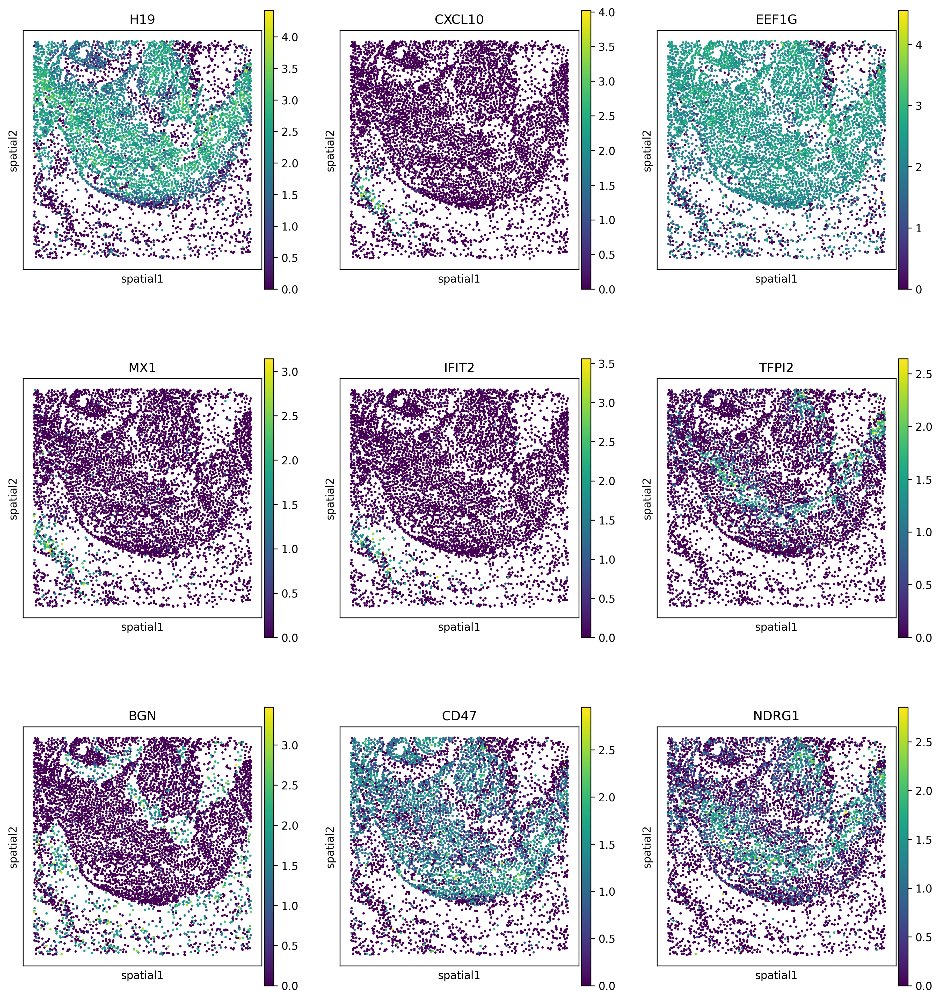

In [30]:
# Let's inspect the spatial expression pattersn for the 9 highest Moran's I scores.
from matplotlib.pyplot import rc_context

color_vars = sdata.tables["table_transcriptomics_squidpy"].uns["moranI"].index[0:9]

with rc_context({"figure.figsize": (4, 5)}):
    sq.pl.spatial_scatter(
        sdata.tables["table_transcriptomics_squidpy"],
        shape=None,
        color=color_vars,
        size=5,
        ncols=3,
        dpi=300,
    )


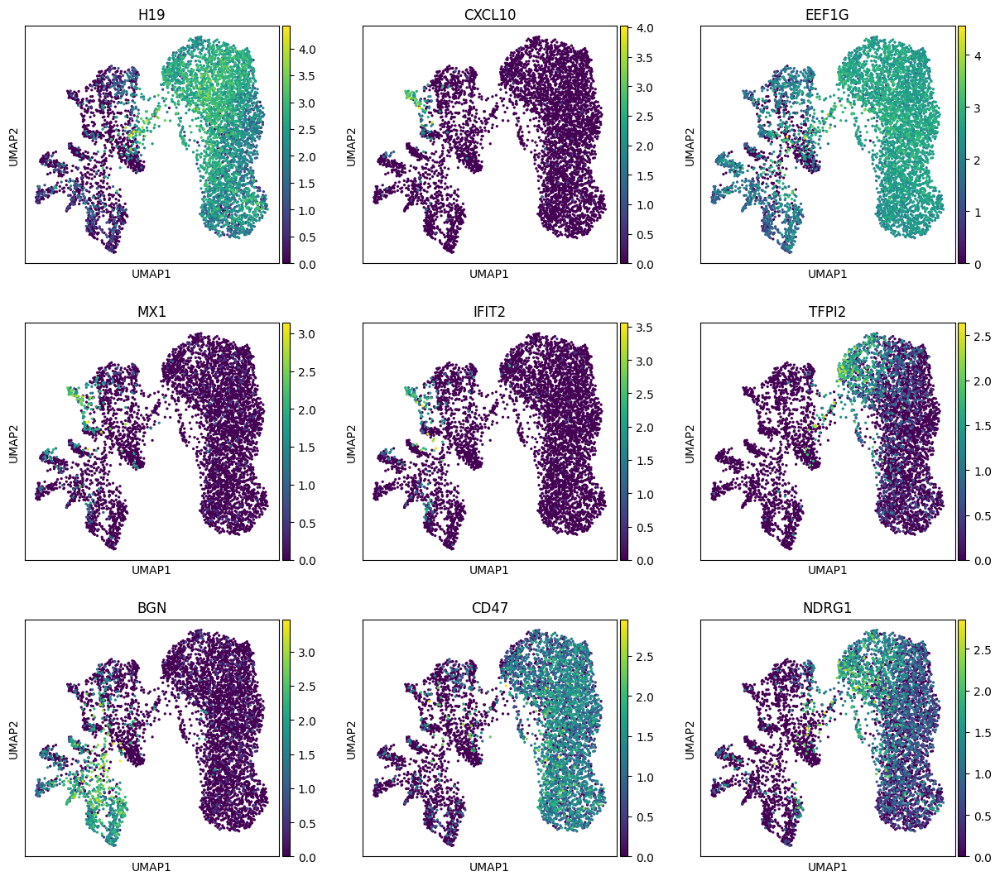

In [31]:
# UMAPs of 9 highest Moran's I scores
with rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(
        sdata.tables["table_transcriptomics_squidpy"],
        color=color_vars,
        ncols=3,
    )

### 12.4 Neighborhood clustering
Since Squidpy's spatial graphs quantify neighbor relationships (i.e. a neighborhood) around each cell, we can use that information to calculate the composition of cell types within that neighborhood. Using k-means clustering, we can then group cells with similar neighborhood compositions to determine local microenvironments.

In [32]:
import squidpy as sq

# First, we create a radius-based spatial graph.
r = 100
sq.gr.spatial_neighbors(
    adata=sdata.tables["table_transcriptomics_annotated"],
    spatial_key="spatial",  # .obsm["spatial"] stores cell centroids in pixel coordinates.
    coord_type="generic",
    radius=r,
    key_added=f"radius_{r}",
)

# Next, we cluster based on neighborhood composition
sdata = hp.tb.nhood_kmeans(
    sdata,
    table_name="table_transcriptomics_annotated",
    output_table_name="table_transcriptomics_annotated",
    cluster_key="annotation",
    connectivity_key=f"radius_{r}",
    composition_key="nhood_composition",
    key_added="nhood_kmeans",
    n_clusters=6,
    nan_label="Isolated",  # Label assigned to isolated cells with zero graph degree.
    overwrite=True,
)

INFO     Creating graph using `generic` coordinates and `None` transform and `1` libraries.                        


C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding will be the default in the next minor release.
  return next(self.gen)
C:\Users\julien.mortier\AppData\Roaming\uv\python\cpython-3.12.12-windows-x86_64-none\Lib\contextlib.py:137: UserWarning: zarr v3 autosharding w

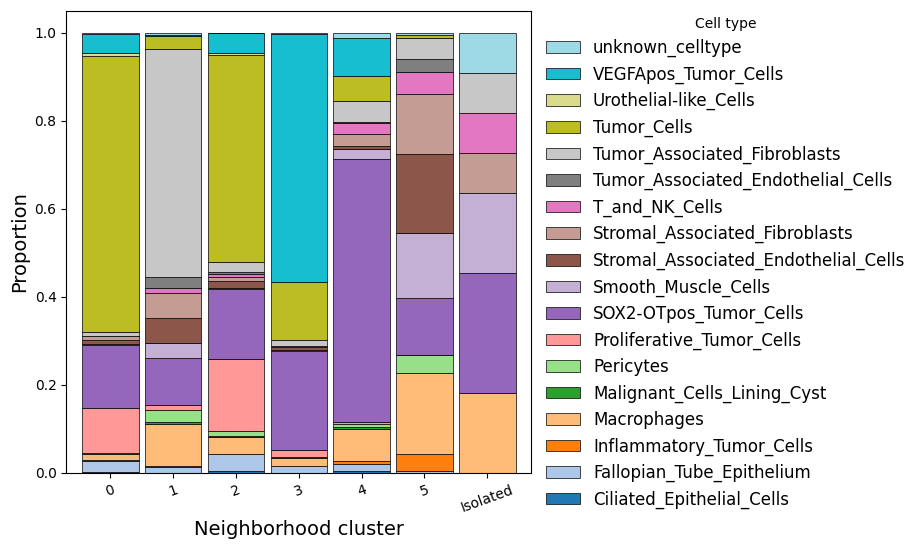

In [33]:
# Plot the cell-type composition of each neighborhood cluster.
pivot_df = sdata.tables["table_transcriptomics_annotated"].obs.pivot_table(
    index="nhood_kmeans", columns="annotation", aggfunc="size", fill_value=0
)
proportions = pivot_df.div(pivot_df.sum(axis=1), axis=0)
proportions = proportions.reset_index()

ax = proportions.plot.bar(
    x="nhood_kmeans",
    stacked=True,
    cmap="tab20",
    figsize=(6, 6),
    width=0.9,
    edgecolor="black",
    linewidth=0.5,
)

fig = ax.get_figure()

ax.set_xlabel("Neighborhood cluster", fontsize=14, color="black")
ax.set_ylabel("Proportion", fontsize=14, color="black")
ax.tick_params(axis="x", rotation=20, colors="black")
ax.tick_params(axis="y", colors="black")

handles, labels = ax.get_legend_handles_labels()
ax.legend(
    handles[::-1],
    labels[::-1],
    title="Cell type",
    bbox_to_anchor=(1, 1.02),
    fontsize=12,
    labelcolor="black",
    frameon=False,
)

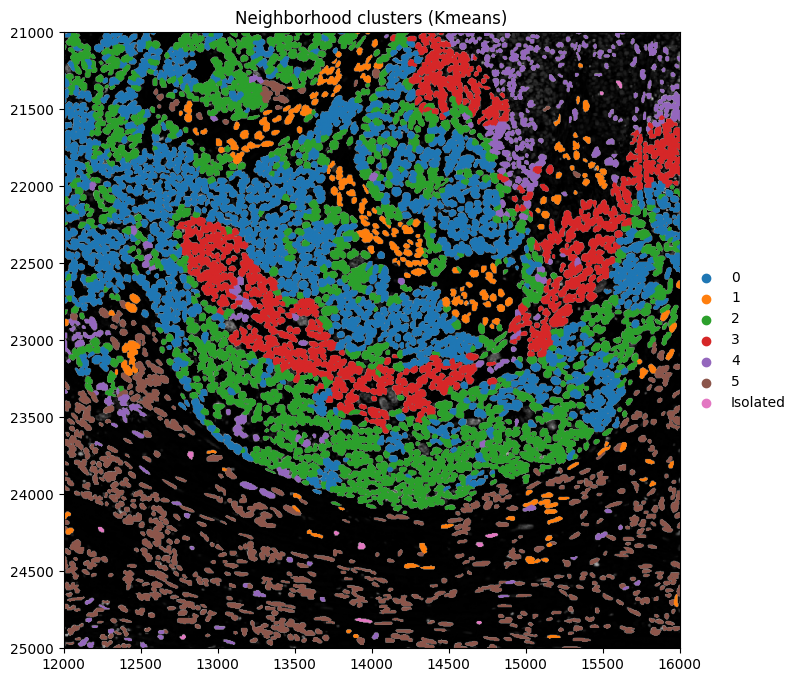

In [34]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax = hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_annotated",
    labels_name="nucleus_segmentation_mask",
    color="nhood_kmeans",
    # crd=(min_x, max_x, min_y, max_y),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey", "colorbar": False},
    render_labels_kwargs={"fill_alpha": 1},
    show_kwargs={"title": "Neighborhood clusters (Kmeans)", "colorbar": True},
    ax=ax,
)

# ax.axis("off")

## 13. Segmentation-free analysis

In [35]:
# First, we create new labels and shapes layers for a hexagonal grid
from spatialdata.transformations import get_transformation

se = hp.im.get_dataarray(sdata, element_name="morphology_focus_global")
shape = (se.shape[2], se.shape[1])

transformations = get_transformation(sdata.images["morphology_focus_global"], get_all=True)

size = 50  # radius of the hexagon, or size length of the square.

sdata = hp.im.add_grid_labels(
    sdata,
    shape=shape,  # shape of the resulting labels layer, shape y, x
    size=size,
    output_shapes_name=f"shapes_spots_{size}um",
    output_labels_name=f"labels_spots_{size}um",
    grid_type="hexagon",  # Set to 'square' for square grid
    offset=(0, 0),
    chunks=1024,
    client=None,
    transformations=transformations,
    scale_factors=(2, 2, 2, 2),
    overwrite=True,
)

2026-06-04 11:42:35.334 | INFO     | harpy.image._manager:add_element:47 - Writing results to element 'labels_spots_50um'
no parent found for <ome_zarr.reader.Label object at 0x0000018F49206930>: None
no parent found for <ome_zarr.reader.Label object at 0x0000018FC225BA10>: None
no parent found for <ome_zarr.reader.Label object at 0x0000018F4C23D190>: None


In [36]:
# Allocate transcripts
sdata = hp.tb.allocate(
    sdata=sdata,
    labels_name=f"labels_spots_{size}um",
    points_name="transcripts_global",  # The points element in `sdata` that contains the transcripts.
    output_table_name="table_transcriptomics_hex",  # The table element in `sdata` in which to save the AnnData object with the transcripts counts per bin.
    update_shapes_elements=False,
    overwrite=True,
)

# Perform preprocessing.
sdata = hp.tb.preprocess_transcriptomics(
    sdata,
    labels_name=f"labels_spots_{size}um",
    table_name="table_transcriptomics_hex",
    output_table_name="table_transcriptomics_hex_preprocessed",  # write results to a new slot, we could also write to the same slot (when passing overwrite==True).
    min_counts=10,
    min_cells=5,
    size_norm=False,
    library_norm=True,
    highly_variable_genes=False,  # If True, will only retain highly variable genes. This can be used for transcriptome-wide methods.
    max_value_scale=10,  # The maximum value to which data will be scaled
    n_comps=50,  # Number of principal components to calculate.
    overwrite=True,
    update_shapes_elements=False,
)

2026-06-04 11:42:36.969 | INFO     | harpy.table._allocation:_aggregate:494 - Calculating cell counts.
2026-06-04 11:42:43.898 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_name 'labels_spots_50um'
2026-06-04 11:42:44.174 | INFO     | harpy.table._preprocess:preprocess:338 - Saving non preprocessed data matrix to the AnnData '.layers[raw_counts]'.


2026-06-04 11:43:25.959 | WARNING  | harpy.utils._io:_incremental_io_on_disk:86 - Element with name 'table_transcriptomics_hex_preprocessed' already exists. Overwriting...


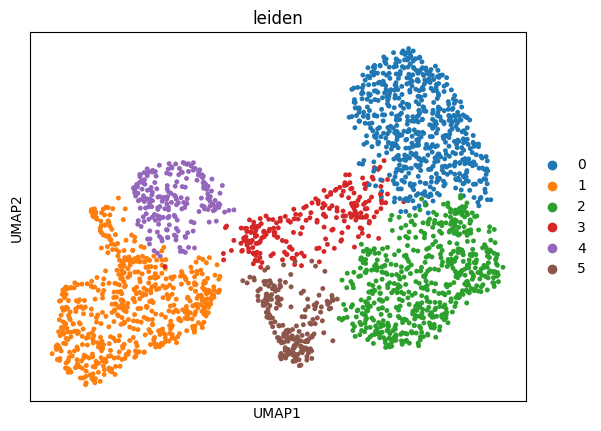

In [37]:
# Leiden clustering
sdata = hp.tb.leiden(
    sdata,
    labels_name=f"labels_spots_{size}um",
    table_name="table_transcriptomics_hex_preprocessed",
    output_table_name="table_transcriptomics_hex_preprocessed",
    calculate_umap=True,
    calculate_neighbors=True,
    n_pcs=17,  # The number of principal components to use when calculating neighbors.
    n_neighbors=35,  # The number of neighbors to consider when calculating neighbors.
    resolution=0.4,
    rank_genes=True,
    key_added="leiden",
    overwrite=True,
)

# Plot UMAP
sc.pl.umap(sdata.tables["table_transcriptomics_hex_preprocessed"], color=["leiden"], show=True)

<Axes: title={'center': 'Leiden clusters'}>

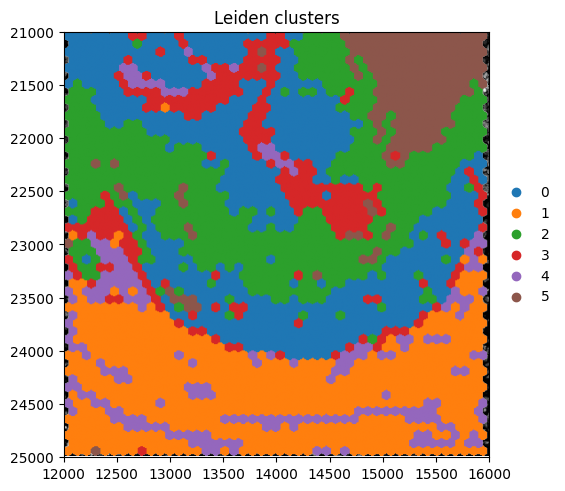

In [38]:
# Plot clusters spatially
hp.pl.plot_sdata(
    sdata,
    image_name="clahe",
    channel="DAPI",
    table_name="table_transcriptomics_hex_preprocessed",
    labels_name=f"labels_spots_{size}um",
    color="leiden",
    # crd=(min_x, max_x, min_y, max_y),
    to_coordinate_system="global",
    render_images_kwargs={"cmap": "grey"},
    render_labels_kwargs={"fill_alpha": 1},
    show_kwargs={"title": "Leiden clusters", "colorbar": False},
)

In [39]:
from spatialdata.models import TableModel

sq.gr.spatial_neighbors(
    adata=sdata["table_transcriptomics_hex_preprocessed"],
    coord_type="grid",  # Set to 'generic' for targeted spatial transcriptomics
    n_neighs=6,  # Only used when delaunay = False
    radius=None,  # To compute the neighbors based on the radius
    delaunay=False,  # Whether to compute the graph from Delaunay triangulation
    set_diag=False,  # Whether to set the diagonal of the connectivity matrix to 1 (i.e. whether cells should be considered neighbors of themselves).
    key_added=None,
)

region = sdata["table_transcriptomics_hex_preprocessed"].uns[TableModel.ATTRS_KEY][TableModel.REGION_KEY]

sdata = hp.tb.add_table(
    sdata,
    adata=sdata.tables["table_transcriptomics_hex_preprocessed"],
    output_table_name="table_transcriptomics_hex_preprocessed",
    region=region,  # A list of regions to associate with the table data. Typically this is all unique elements in adata.obs[_REGION_KEY].
    overwrite=True,
)

INFO     Creating graph using `grid` coordinates and `None` transform and `1` libraries.                           


2026-06-04 11:43:51.704 | WARNING  | harpy.utils._io:_incremental_io_on_disk:86 - Element with name 'table_transcriptomics_hex_preprocessed' already exists. Overwriting...


In [40]:
# Calculate Moran’s I global spatial auto-correlation statistics
sq.gr.spatial_autocorr(
    adata=sdata.tables["table_transcriptomics_hex_preprocessed"],
    mode="moran",
    n_perms=10,  # We set this to 10 to speed up the calculations for the training. When working with actual data, n_perms=100 is probably more appropriate.
    n_jobs=1,
)

# Add table layer to back to zarr
sdata = hp.tb.add_table(
    sdata,
    adata=sdata.tables["table_transcriptomics_hex_preprocessed"],
    output_table_name="table_transcriptomics_hex_preprocessed",
    region=region,
    overwrite=True,
)

  0%|          | 0/10 [00:00<?, ?/s]

2026-06-04 11:44:41.215 | WARNING  | harpy.utils._io:_incremental_io_on_disk:86 - Element with name 'table_transcriptomics_hex_preprocessed' already exists. Overwriting...


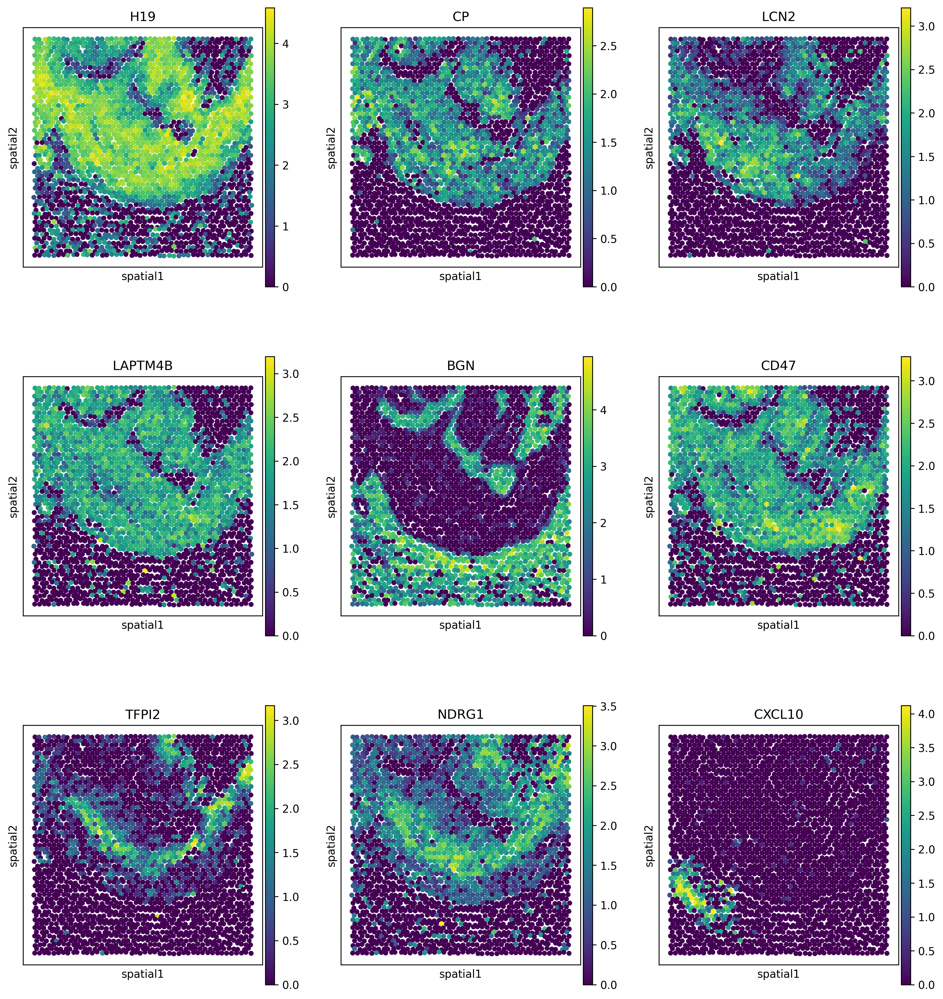

In [41]:
from matplotlib.pyplot import rc_context

# Let's inspect the spatial expression patterns for the 9 highest Moran's I scores.
color_vars = sdata.tables["table_transcriptomics_hex_preprocessed"].uns["moranI"].index[0:9]

with rc_context({"figure.figsize": (4, 5)}):
    sq.pl.spatial_scatter(
        sdata.tables["table_transcriptomics_hex_preprocessed"],
        shape=None,
        color=color_vars,
        size=50,
        ncols=3,
        dpi=300,
    )

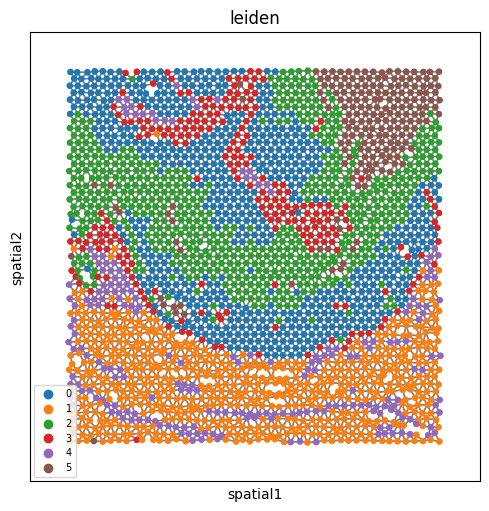

In [42]:
sq.pl.spatial_scatter(
    sdata.tables["table_transcriptomics_hex_preprocessed"],
    shape=None,
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=50,
    figsize=(5, 5),
    legend_loc="best",
    legend_fontsize=7,
    dpi=100,
)